![logo](./img/LogoLine_horizon_CAMS.png)

# Antarctic Ozone Hole Monitoring Tutorial

This tutorial provides guided examples of ozone monitoring using data from the [Copernicus Atmosphere Monitoring Service (CAMS)](https://atmosphere.copernicus.eu/). It is divided into two parts:

1. View animation of Antarctic ozone hole
2. Calculate the size of the Antarctic ozone hole

It uses CAMS global reanalysis (EAC4) data freely available from the [Atmosphere Data Store (ADS)](https://ads.atmosphere.copernicus.eu)

## Install and import packages

In [1]:
!pip install cdsapi

In [1]:
# CDS API
import cdsapi

# Libraries for reading and working with multidimensional arrays
import numpy as np
import xarray as xr

# Libraries for plotting and animating data
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.animation as animation
import cartopy.crs as ccrs
from IPython.display import HTML

# Disable warnings for data download via API
import urllib3 
urllib3.disable_warnings()

from collections import OrderedDict

## Download and read and pre-process ozone data

### Download data

Copy your API key into the code cell below, replacing `#######` with your key. (Remember, to access data from the ADS, you will need first to register/login https://ads.atmosphere.copernicus.eu and obtain an API key from https://ads.atmosphere.copernicus.eu/api-how-to.)

In [2]:
URL = 'https://ads.atmosphere.copernicus.eu/api/v2'

# Replace the hashtags with your key:
KEY = '##########################################'

Here we specify a data directory into which we will download our data and all output files that we will generate:

In [3]:
DATADIR = './'

For this tutorial, we will use CAMS Global Reanalysis (EAC4) data. The code below shows the subset characteristics that we will extract from this dataset as an API request.

```{note}
Before running this code, ensure that you have **accepted the terms and conditions**. This is something you only need to do once for each CAMS dataset. You will find the option to do this by selecting the dataset in the ADS, then scrolling to the end of the *Download data* tab.
```

In [4]:
c = cdsapi.Client(url=URL, key=KEY)
c.retrieve(
    'cams-global-reanalysis-eac4',
    {
        'variable': 'total_column_ozone',
        'date': '2020-07-01/2021-01-31',
        'time': '00:00',
        'format': 'netcdf',
        'area': [
            0, -180, -90,
            180,
        ],
    },
    f'{DATADIR}/TCO3_202007-202101_SHem.nc')

2022-09-09 15:06:01,399 INFO Welcome to the CDS
2022-09-09 15:06:01,402 INFO Sending request to https://ads.atmosphere.copernicus.eu/api/v2/resources/cams-global-reanalysis-eac4
2022-09-09 15:06:01,573 INFO Request is completed
2022-09-09 15:06:01,574 INFO Downloading https://download-0001-ads-clone.copernicus-climate.eu/cache-compute-0001/cache/data9/adaptor.mars.internal-1661759327.7060935-9333-16-bc780d63-b991-4a5d-8453-84291afb7547.nc to .//TCO3_202007-202101_SHem.nc (23.8M)
2022-09-09 15:06:04,956 INFO Download rate 7M/s                                                                        


Result(content_length=24978808,content_type=application/x-netcdf,location=https://download-0001-ads-clone.copernicus-climate.eu/cache-compute-0001/cache/data9/adaptor.mars.internal-1661759327.7060935-9333-16-bc780d63-b991-4a5d-8453-84291afb7547.nc)

### Import and inspect data

Here we read the data we downloaded into an xarray Dataset, and view its contents:

In [58]:
fn = f'{DATADIR}/TCO3_202007-202101_SHem.nc'
ds = xr.open_dataset(fn)
ds

<xarray.Dataset>
Dimensions:    (longitude: 480, latitude: 121, time: 215)
Coordinates:
  * longitude  (longitude) float32 -180.0 -179.2 -178.5 ... 177.8 178.5 179.2
  * latitude   (latitude) float32 0.0 -0.75 -1.5 -2.25 ... -88.5 -89.25 -90.0
  * time       (time) datetime64[ns] 2020-07-01 2020-07-02 ... 2021-01-31
Data variables:
    gtco3      (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2022-08-29 07:48:48 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

We can see that the data has three coordinate dimensions (longitude, latitude and time) and one variable, total column ozone. By inspecting the coordinates we can see the data is of the southern hemisphere from 1st July 2020 to 31 January 2021 at 00:00 UTC each day. This includes the entire period in which the Antarctic ozone hole appears.

```{note}
This is only a subset of the CAMS Global Reanalysis data available on the [ADS](https://ads.atmosphere.copernicus.eu), which includes global data at 3 hourly resolution (in addition to monthly averages), from 2003 to the present, and at 60 model levels (vertical layers) in the atmosphere.
```

To facilitate further processing, we convert the Xarray Dataset into an Xarray Data Array containing the single variable of total column ozone.

In [59]:
tco3 = ds['gtco3']

### Unit conversion

We can see from the attributes of our data are represented as mass concentration of ozone, in units of kg m**-2. We would like to convert this into Dobson Units, which is a standard for ozone measurements. The Dobson unit is defined as the thickness (in units of 10 μm) of a layer of pure gas (in this case O3) which would be formed by the total column amount at standard conditions for temperature and pressure.

In [60]:
convertToDU = 1 / 2.1415e-5

In [61]:
tco3 = tco3 * convertToDU

## View Antarctic ozone hole 

Let us now visualise our data in form of maps and animations. 

We will first define the colour scale we would like to represent our data.

### Define colour scale

Extract range of values

In [62]:
tco3max = tco3.max()
tco3min = tco3.min()
tco3range = (tco3max - tco3min)/20.

Define colourmap

In [63]:
cmap = plt.cm.jet
norm = colors.BoundaryNorm(np.arange(tco3min, tco3max, tco3range), cmap.N)

### Plot map

We will now plot our data. Let us begin with a map for the first time step, 1 July 2020.

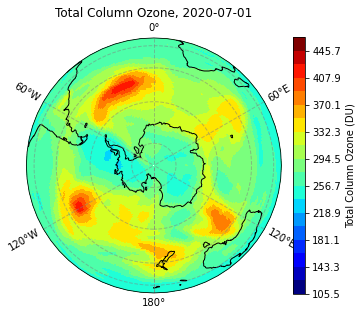

In [11]:
fig = plt.figure(figsize=(5, 5)) 
ax = plt.subplot(1,1,1, projection=ccrs.Orthographic(central_latitude=-90)) 
ax.coastlines(color='black') # Add coastlines
ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--') 
ax.set_title(f'Total Column Ozone, {str(tco3.time[0].values)[:-19]}', fontsize=12) 
im = plt.pcolormesh(tco3.longitude.values, tco3.latitude.values, tco3[0,:,:],
                cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar = plt.colorbar(im,fraction=0.046, pad=0.04) 
cbar.set_label('Total Column Ozone (DU)') 

### Create animation

Let us now view the entire time series by means of an animation that shows all time steps. We see from the dataset description above, that the time dimension in our data includes 215 entries. These correspond to 215 time steps, i.e. 215 days, between 1 July 2020 and 31 January 2021. The number of frames of our animation is therefore 215.

In [12]:
frames = 215

Now we will create an animation. The last cell, which creates the animation in Javascript, may take a few minutes to run.

In [13]:
def animate(i):
    array = tco3[i,:,:].values
    im.set_array(array.flatten())
    ax.set_title(f'Total Column Ozone, {str(tco3.time[i].values)[:-19]}', fontsize=12)

In [15]:
ani = animation.FuncAnimation(fig, animate, frames, interval=100)
ani.save(f'{DATADIR}/TCO3_202007-202101_SHem.gif')
HTML(ani.to_jshtml())

2022-09-04 23:27:35,654 INFO Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
2022-09-04 23:27:35,655 INFO MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 360x360 -pix_fmt rgba -r 10.0 -loglevel error -i pipe: -filter_complex 'split [a][b];[a] palettegen [p];[b][p] paletteuse' -y .//TCO3_202007-202101_SHem.gif
2022-09-04 23:28:36,187 INFO Animation.save using <class 'matplotlib.animation.HTMLWriter'>


<div class="alert alert-block alert-success">
<b>ACTIVITY</b>: <br>
    In what date range does the ozone hole appear greatest? In the next section we will quantify the size of the ozone hole at each time step.
</div>

## Calculate size of ozone hole

In this section we will calculate the actual size of the ozone hole, and plot its evolution over our time series. We will then apply the exact same method on monthly averaged data over the past decades to compare ozone hole extents at each yearly occurence since 2003.

### Define constants

In order to calculate the size of the ozone hole, we need to define some constants. These include the following:

Ozone hole limit, i.e. minimum ozone, in Dobson units, beneath which we consider there to be a hole in the ozone layer.

In [64]:
OZONE_HOLE_LIMIT = 220.

Radius of the Earth, in order to calculate the size of each geographic grid cell of our data.

In [65]:
Rearth = 6371009.

### Calculate area of each geographic grid cell of our data

Here we calculate the size of each grid cell of our data, which varies as a function of latitude. The formula we apply is the following:

area = |(sin(top latitude) - sin(bottom latitude))| * |Δlongitude| * Earth radius squared

First we define a function to apply this formula, taking as arguments the min and max of the latitudes and longitudes represented by each grid cell:

In [66]:
def geo_area_array(lats1,lons1,lats2,lons2):
    area= np.abs(np.sin(np.deg2rad(lats1)) - np.sin(np.deg2rad(lats2))) * np.abs(np.deg2rad(lons1-lons2))
    area = area * Rearth * Rearth 
    return area

Then we apply this function to our data, defining first the longitude and latitude delta at each grid cell.

In [67]:
DeltaLat = 0.75 # Latitudinal spatial resolution, in degrees
DeltaLon = 0.75 # Longitudinal spatial resolution, in degrees

In [68]:
tco3['areas'] = geo_area_array(tco3['latitude']-DeltaLat/2, tco3['longitude']-DeltaLat/2, 
                             tco3['latitude']+DeltaLat/2, tco3['longitude']+DeltaLat/2)

### Mask data belonging to Antarctic ozone hole

We now calculate the grid cells that meet the criteria of belonging to the Antarctic ozone hole: i.e. they have less than the minimum threshold of ozone, and they are below -60 degrees latitude.

Here we define a mask with the threshold conditions for ozone and latitude:

In [69]:
mask = tco3.where((tco3 < OZONE_HOLE_LIMIT) & (tco3["latitude"] < -60.))

All data points that do not meet the conditions are set to NaN (Not a Number) in the resulting array. Dividing this array by itself gives us a mask with each valid data point set to 1. Multiplying this by the corresponding areas leaves us with an array of grid cell areas that meet the conditions of belonging to the Antarctic ozone hole.

In [70]:
area = (mask / mask) * mask['areas']

### Calculate ozone hole area

If we now sum these grid cell areas, we have the total ozone hole extent. This is applied across each time step. We multiply by the number 1e-12 to convert from meters squared to million kilometers squared.

In [71]:
ozone_hole = area.sum(dim=["latitude", "longitude"], skipna=True) * 1e-12

Let us update the Data Array attributes:

In [72]:
ozone_hole.attrs['long_name'] = 'Ozone hole area'
ozone_hole.attrs['units'] = 'million km^2'

### Plot ozone hole area at each time step

Finally we can plot the evolution of the ozone hole, in million km squared, throughout the time series.

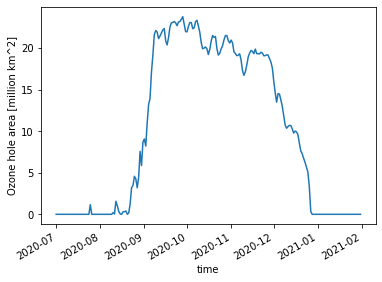

In [73]:
ozone_hole.plot()

We can also calculate the maximum extent of the ozone hole:

In [74]:
index = ozone_hole.argmax() # Here we find the index of the maximum value
print('Max extent of O3 hole:', ozone_hole[index].values, 'million km2')

Max extent of O3 hole: 23.757296 million km2


... and find out when this was reached:

In [75]:
print('This was reached on:', ozone_hole[index].time.values)

This was reached on: 2020-09-28T00:00:00.000000000


<div class="alert alert-block alert-success">
<b>ACTIVITY</b>: <br>
    Now repeat the steps above with the data below (see API request in cell below). See what you find out about the evolution of the ozone hole since 2003!
</div>

In [22]:
c.retrieve(
    'cams-global-reanalysis-eac4-monthly',
    {
        'format': 'netcdf',
        'variable': 'total_column_ozone',
        'year': [
            '2003', '2004', '2005',
            '2006', '2007', '2008',
            '2009', '2010', '2011',
            '2012', '2013', '2014',
            '2015', '2016', '2017',
            '2018', '2019', '2020',
            '2021',
        ],
        'month': [
            '01', '02', '03',
            '04', '05', '06',
            '07', '08', '09',
            '10', '11', '12',
        ],
        'product_type': 'monthly_mean',
    },
    f'{DATADIR}/TCO3_monthly_2003-2021.nc')

2022-09-09 15:06:35,205 INFO Welcome to the CDS
2022-09-09 15:06:35,205 INFO Sending request to https://ads.atmosphere.copernicus.eu/api/v2/resources/cams-global-reanalysis-eac4-monthly
2022-09-09 15:06:35,299 INFO Downloading https://download-0001-ads-clone.copernicus-climate.eu/cache-compute-0001/cache/data9/adaptor.mars.internal-1658705398.7657485-1943-2-d0f9ab5f-631f-4408-8063-cf04e6396f84.nc to .//TCO3_monthly_2003-2021.nc (50.3M)
2022-09-09 15:06:42,048 INFO Download rate 7.5M/s                                                                      


Result(content_length=52755016,content_type=application/x-netcdf,location=https://download-0001-ads-clone.copernicus-climate.eu/cache-compute-0001/cache/data9/adaptor.mars.internal-1658705398.7657485-1943-2-d0f9ab5f-631f-4408-8063-cf04e6396f84.nc)